In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt

In [2]:
import rasterio
from rasterio.plot import show

In [3]:
import riverrem

In [9]:
# from riverrem.REMMaker import REMMaker
# # provide the DEM file path and desired output directory
# rem_maker = REMMaker(dem='../data/input_rem_data/v3/buffaloBayouRegionalV4_USGS10m.tif', out_dir='../data/output_rem_data/v3/', centerline_shp='../data/combined_BrazosBuffaloBayou.shp')
# # create an REM
# rem_maker.make_rem()
# # create an REM visualization with the given colormap
# rem_maker.make_rem_viz(cmap='mako_r')

In [6]:
# Read the shapefiles
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')

[INFO] 2024-05-21 22:28:04,545 - Failed to auto identify EPSG: 7


In [7]:
gdf_rem_v1 = gpd.read_file('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_river_pts.shp')

<AxesSubplot:>

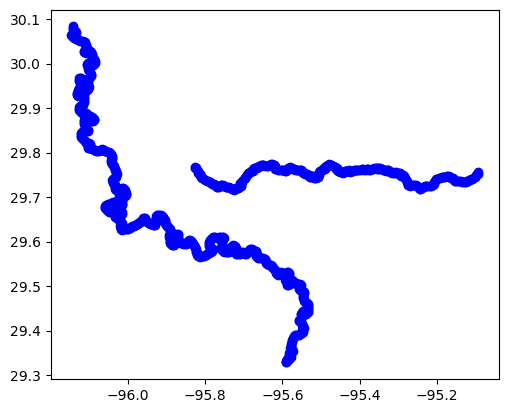

In [8]:
fig, ax = plt.subplots(1, 1)
gdf_rem_v1.plot(ax=ax, color='blue')

<AxesSubplot:>

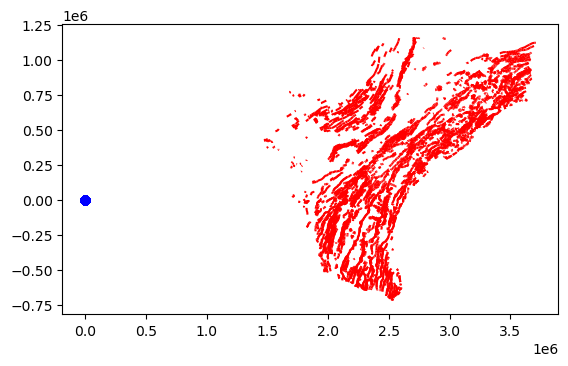

In [10]:
# Visualize the shapefiles
fig, ax = plt.subplots(1, 1)
gdf_faults.plot(ax=ax, color='red')
gdf_rem_v1.plot(ax=ax, color='blue')

[INFO] 2024-05-21 22:28:23,685 - Failed to auto identify EPSG: 7
/Users/justingosses/opt/miniconda3/envs/river-dem/lib/python3.10/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


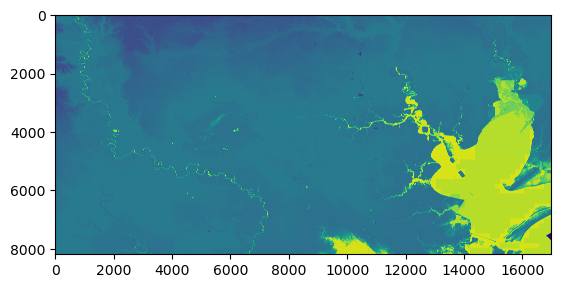

In [11]:
# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_hillshade-color.tif') as src:
    img = src.read(1)  # read the first band

# Load the shapefile
gdf = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')

# Clip the shapefile to the extent of the TIFF
gdf = gdf.cx[src.bounds.left:src.bounds.right, src.bounds.bottom:src.bounds.top]

# Plot the TIFF
fig, ax = plt.subplots(1, 1)
show(img, ax=ax)

# Overlay the shapefile
gdf.plot(ax=ax, color='none', edgecolor='red')

plt.show()

[INFO] 2024-05-21 22:28:28,390 - Failed to auto identify EPSG: 7


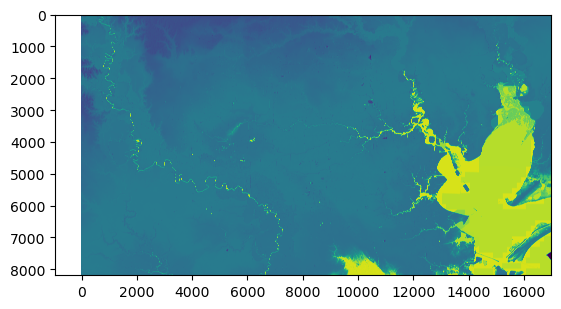

In [12]:
import geopandas as gpd
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_hillshade-color.tif') as src:
    img = src.read(1)  # read the first band
    tiff_crs = src.crs

# Load the shapefile
gdf = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')

# Check if the CRS of the shapefile matches the CRS of the TIFF
if gdf.crs != tiff_crs:
    gdf = gdf.to_crs(tiff_crs)

# Clip the shapefile to the extent of the TIFF
gdf = gdf.cx[src.bounds.left:src.bounds.right, src.bounds.bottom:src.bounds.top]

# Plot the TIFF
fig, ax = plt.subplots(1, 1)
show(img, ax=ax)

# Overlay the shapefile
gdf.plot(ax=ax, color='none', edgecolor='red')

plt.show()

In [14]:
from osgeo import osr

# Open the .prj file
with open('../data/faults/texas_faults_fromDor/texas_faults.prj', 'r') as f:
    prj_txt = f.read()

# Create a SpatialReference object
srs = osr.SpatialReference()

# Import the prj contents into the SpatialReference object
srs.ImportFromWkt(prj_txt)

# Print the CRS
print(srs)

PROJCS["Texas South Central 4204",
    GEOGCS["NAD27 Coordinate System",
        DATUM["D_North American Datum 1927 (NAD27)",
            SPHEROID["Clarke 1866",6378206.4,294.9786982,
                AUTHORITY["EPSG","7008"]]],
        PRIMEM["Greenwich",0],
        UNIT["Degree",0.0174532925199433]],
    PROJECTION["Lambert_Conformal_Conic_2SP"],
    PARAMETER["latitude_of_origin",27.833333333333],
    PARAMETER["central_meridian",-99],
    PARAMETER["standard_parallel_1",28.383333333333],
    PARAMETER["standard_parallel_2",30.283333333333],
    PARAMETER["false_easting",2000000],
    PARAMETER["false_northing",0],
    UNIT["US survey foot",0.304800609601219,
        AUTHORITY["EPSG","9003"]],
    AXIS["Easting",EAST],
    AXIS["Northing",NORTH]]


In [15]:
# Load the shapefile
gdf = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')

# Reproject the CRS to EPSG:4326
gdf_faults  = gdf.to_crs('EPSG:4269')

[INFO] 2024-05-21 22:28:43,764 - Failed to auto identify EPSG: 7


<AxesSubplot:>

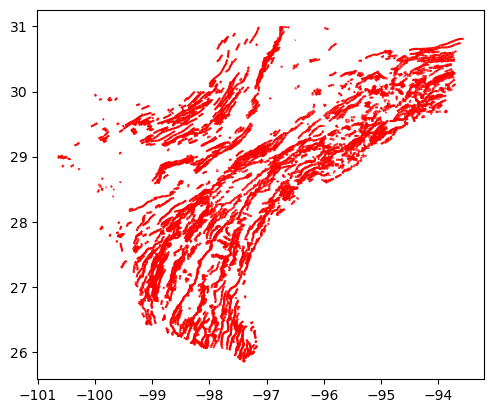

In [16]:
# Visualize the shapefiles
fig, ax = plt.subplots(1, 1)
gdf_faults.plot(ax=ax, color='red')

tiff_crs EPSG:4269


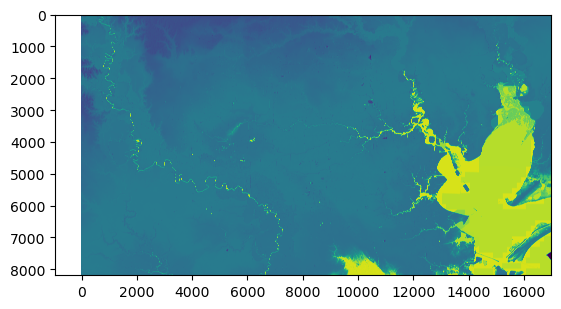

In [17]:
# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_hillshade-color.tif') as src:
    img = src.read(1)  # read the first band
    tiff_crs = src.crs
    print("tiff_crs", tiff_crs)
# Load the shapefile
#gdf_faults = gdf 

# Check if the CRS of the shapefile matches the CRS of the TIFF
if gdf_faults.crs != tiff_crs:
    gdf_faults = gdf_faults.to_crs(tiff_crs)

# Clip the shapefile to the extent of the TIFF
gdf_faults = gdf_faults.cx[src.bounds.left:src.bounds.right, src.bounds.bottom:src.bounds.top]

# Plot the TIFF
fig, ax = plt.subplots(1, 1)
show(img, ax=ax)

# Overlay the shapefile
gdf_faults.plot(ax=ax, color='none', edgecolor='red')

plt.show()

[INFO] 2024-05-21 22:28:53,058 - Failed to auto identify EPSG: 7


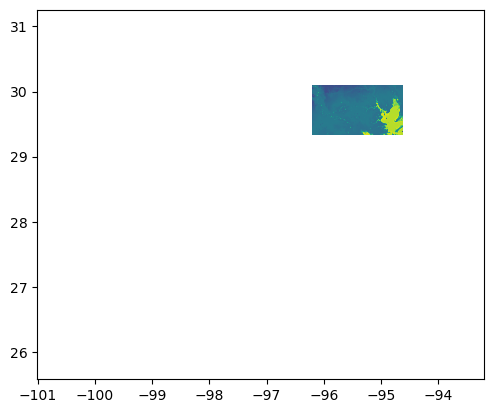

In [18]:
import geopandas as gpd
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
import matplotlib.pyplot as plt

# Load the shapefile and reproject it to EPSG:4326
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')
gdf_faults = gdf_faults.to_crs('EPSG:4326')

# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_hillshade-color.tif') as src:
    # Calculate the transform and the dimensions for the new CRS
    transform, width, height = calculate_default_transform(src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    # Create a new raster for the reprojected TIFF
    with rasterio.open('reprojected.tif', 'w', driver='GTiff', height=height, width=width, count=1, dtype=src.dtypes[0], crs='EPSG:4326', transform=transform) as reprojected:
        # Reproject the TIFF to EPSG:4326
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(reprojected, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest)

# Load the reprojected TIFF
with rasterio.open('reprojected.tif') as reprojected:
    img = reprojected.read(1)

# Plot the reprojected TIFF
fig, ax = plt.subplots(1, 1)
show(img, ax=ax, transform=transform)

# Overlay the reprojected shapefile
gdf_faults.plot(ax=ax, color='none', edgecolor='red')

plt.show()

[INFO] 2024-05-21 22:28:59,757 - Failed to auto identify EPSG: 7


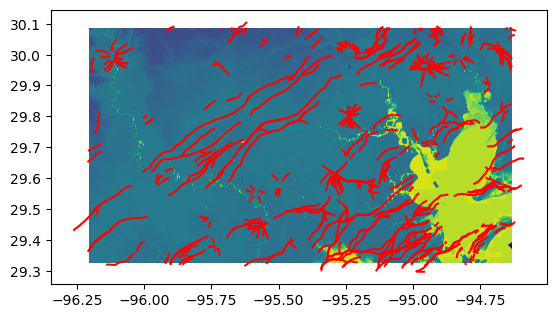

In [19]:
import geopandas as gpd
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
import matplotlib.pyplot as plt

# Load the shapefile and reproject it to EPSG:4326
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')
gdf_faults = gdf_faults.to_crs('EPSG:4326')

# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_hillshade-color.tif') as src:
    # Calculate the transform and the dimensions for the new CRS
    transform, width, height = calculate_default_transform(src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    # Create a new raster for the reprojected TIFF
    with rasterio.open('reprojected.tif', 'w', driver='GTiff', height=height, width=width, count=1, dtype=src.dtypes[0], crs='EPSG:4326', transform=transform) as reprojected:
        # Reproject the TIFF to EPSG:4326
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(reprojected, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest)

# Load the reprojected TIFF
with rasterio.open('reprojected.tif') as reprojected:
    img = reprojected.read(1)

    # Clip the reprojected shapefile to the extent of the reprojected TIFF
    gdf_faults = gdf_faults.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]

# Plot the reprojected TIFF
fig, ax = plt.subplots(1, 1)
show(img, ax=ax, transform=transform)

# Overlay the reprojected and clipped shapefile
gdf_faults.plot(ax=ax, color='red', edgecolor='red')

# Load the GeoJSON file
gdf_geojson = gpd.read_file('../data/buffaloBayouTestGeojson.geojson')

# Reproject the GeoJSON to EPSG:4326
gdf_geojson = gdf_geojson.to_crs('EPSG:4326')


plt.show()

[INFO] 2024-05-21 22:29:06,706 - Failed to auto identify EPSG: 7


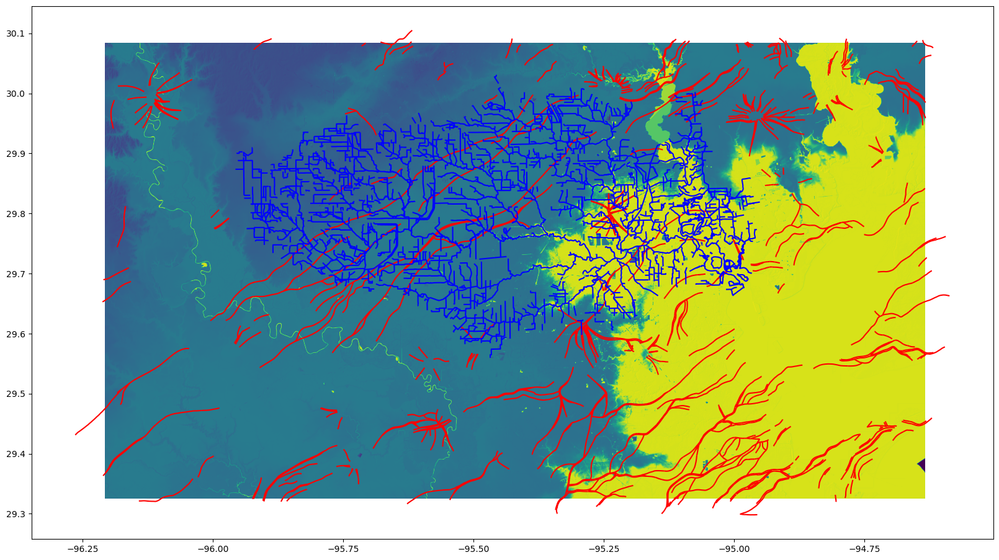

In [20]:
import geopandas as gpd
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
import matplotlib.pyplot as plt

# Load the shapefile and reproject it to EPSG:4326
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')
gdf_faults = gdf_faults.to_crs('EPSG:4326')

# Load the second shapefile and reproject it to EPSG:4326
gdf_nhda = gpd.read_file('../data/rivers_NHD/Shape/NHDFlowline.shp') #python_data_processing/data/rivers_NHD/Shape/NHDWaterbody.shp
gdf_nhda = gdf_nhda.to_crs('EPSG:4326')

# Load the TIFF
with rasterio.open('../data/output_rem_data/v1/buffaloBayouRegionalV1_USGS10m_hillshade-color.tif') as src:
    # Calculate the transform and the dimensions for the new CRS
    transform, width, height = calculate_default_transform(src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    # Create a new raster for the reprojected TIFF
    with rasterio.open('reprojected.tif', 'w', driver='GTiff', height=height, width=width, count=1, dtype=src.dtypes[0], crs='EPSG:4326', transform=transform) as reprojected:
        # Reproject the TIFF to EPSG:4326
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(reprojected, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest)

# Load the reprojected TIFF
with rasterio.open('reprojected.tif') as reprojected:
    img = reprojected.read(1)

    # Clip the reprojected shapefile to the extent of the reprojected TIFF
    gdf_faults = gdf_faults.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]
    gdf_nhda = gdf_nhda.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]


# Plot the reprojected TIFF
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Adjust the size as needed
show(img, ax=ax, transform=transform)

# Overlay the reprojected and clipped shapefile
gdf_faults.plot(ax=ax, color='red', edgecolor='red')
gdf_nhda.plot(ax=ax, color='blue', edgecolor='blue')

plt.show()

[INFO] 2024-05-21 22:29:18,345 - Failed to auto identify EPSG: 7


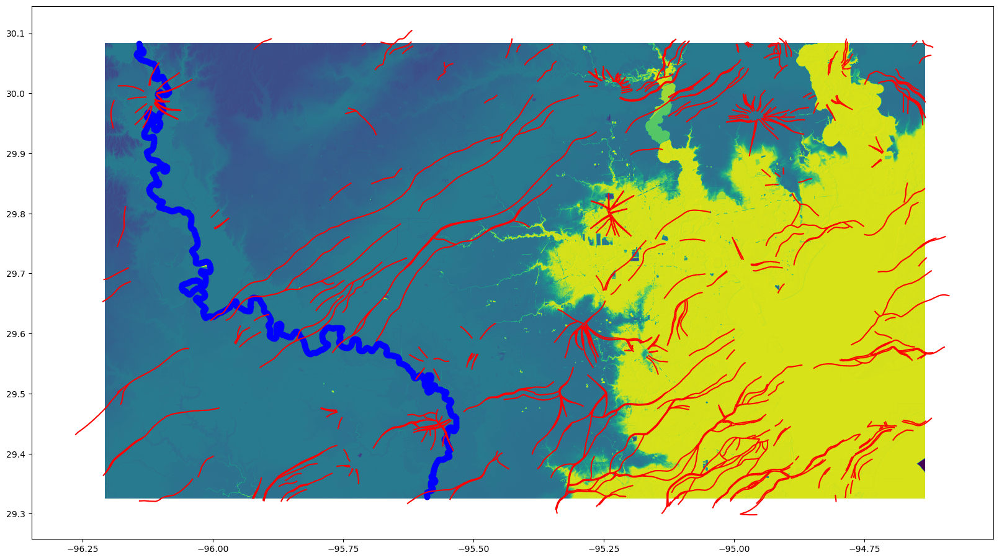

In [21]:
import geopandas as gpd
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
import matplotlib.pyplot as plt

# Load the shapefile and reproject it to EPSG:4326
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')
gdf_faults = gdf_faults.to_crs('EPSG:4326')

# Load the second shapefile and reproject it to EPSG:4326
gdf_nhda = gpd.read_file('../data/output_rem_data/v1/buffaloBayouRegionalV1_USGS10m_river_pts.shp') #python_data_processing/data/rivers_NHD/Shape/NHDWaterbody.shp
gdf_nhda = gdf_nhda.to_crs('EPSG:4326')

# Load the TIFF
with rasterio.open('../data/output_rem_data/v1/buffaloBayouRegionalV1_USGS10m_hillshade-color.tif') as src:
    # Calculate the transform and the dimensions for the new CRS
    transform, width, height = calculate_default_transform(src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    # Create a new raster for the reprojected TIFF
    with rasterio.open('reprojected.tif', 'w', driver='GTiff', height=height, width=width, count=1, dtype=src.dtypes[0], crs='EPSG:4326', transform=transform) as reprojected:
        # Reproject the TIFF to EPSG:4326
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(reprojected, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest)

# Load the reprojected TIFF
with rasterio.open('reprojected.tif') as reprojected:
    img = reprojected.read(1)

    # Clip the reprojected shapefile to the extent of the reprojected TIFF
    gdf_faults = gdf_faults.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]
    gdf_nhda = gdf_nhda.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]


# Plot the reprojected TIFF
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Adjust the size as needed
show(img, ax=ax, transform=transform)

# Overlay the reprojected and clipped shapefile
gdf_faults.plot(ax=ax, color='red', edgecolor='red')
gdf_nhda.plot(ax=ax, color='blue', edgecolor='blue')

plt.show()

In [22]:
import os

In [23]:
shapefile = gpd.read_file('../data/rivers_NHD/Shape/NHDFlowline.shp')
print(type(shapefile))
print(shapefile)

<class 'geopandas.geodataframe.GeoDataFrame'>
     permanent_       fdate  resolution   gnis_id              gnis_name  \
0     113253061  2012-01-04           2      None                   None   
1     109566003  2012-01-04           2      None                   None   
2     113254783  2012-01-04           2  01373919           Greens Bayou   
3     113255589  2012-01-04           2      None                   None   
4     113255303  2012-01-04           2      None                   None   
...         ...         ...         ...       ...                    ...   
2877  113251823  2012-01-04           2      None                   None   
2878  113252195  2012-01-04           2      None                   None   
2879  113254411  2012-01-04           2      None                   None   
2880  113253935  2012-01-04           2  01374616  Little Whiteoak Bayou   
2881  113255137  2014-12-05           2      None                   None   

      lengthkm       reachcode  flowdir w

In [25]:
test = shapefile[shapefile['gnis_name']!='Buffalo Bayou 3452']

In [26]:
test['gnis_name'].unique()

array([None, 'Greens Bayou', 'Sims Bayou', 'West Canal', 'Langham Creek',
       'Bear Creek', 'Cotton Patch Bayou', 'Brays Bayou', 'Buffalo Bayou',
       'Garners Bayou', 'Whiteoak Bayou', 'Carpenters Bayou',
       'Willow Fork', 'Spring Branch', 'South Mayde Creek', 'Plum Creek',
       'Snake Creek', 'Little Prong', 'Vince Bayou', 'Briar Branch',
       'Vogel Creek', 'Bering Ditch', 'Mason Creek', 'Berry Bayou',
       'Little Whiteoak Bayou', 'Halls Bayou', 'Rummel Creek',
       'Horsepen Creek', 'Goose Creek', 'Hunting Bayou', 'Patrick Bayou',
       'Keegans Bayou', 'San Jacinto River Authority Canal',
       'San Jacinto River', 'Willow Waterhole Bayou', 'Cole Creek',
       'East Fork Patrick Bayou', 'Cane Island Branch', 'Turkey Creek',
       'Tucker Bayou', 'Country Club Bayou', 'Reinhardt Bayou',
       'Jackson Bayou', 'Dinner Creek', 'Williams Gully', 'Berry Creek',
       'Panther Creek', 'Rolling Fork', 'West Fork Goose Creek',
       'Little Vince Bayou', 'Boggy Ba

In [27]:
geodf_buffaloBayou = shapefile[shapefile['gnis_name']=='Buffalo Bayou']

In [28]:
geodf_buffaloBayou.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [29]:
geodf_buffaloBayou.length

/var/folders/ry/tr7t3nh122z_0n6rz2cl3lv40000gn/T/ipykernel_48762/724724451.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  geodf_buffaloBayou.length


47      0.003579
89      0.001425
136     0.003018
180     0.016738
197     0.006626
          ...   
2801    0.010228
2804    0.009728
2813    0.027208
2829    0.005220
2862    0.011094
Length: 76, dtype: float64

In [30]:
geodf_buffaloBayou 

,permanent_,fdate,resolution,gnis_id,gnis_name,lengthkm,reachcode,flowdir,wbarea_per,ftype,fcode,mainpath,innetwork,visibility,SHAPE_Leng,Enabled,ObjectID,geometry
47,113254399,2012-01-04,2,01372802,Buffalo Bayou,0.359,12040104000055,1,None,460,46006,0,1,5000000,0.003579,1,48,"LINESTRING Z (-95.48178 29.77218 0.00000, -95...."
89,113254947,2012-01-04,2,01372802,Buffalo Bayou,0.139,12040104002441,1,120007513,558,55800,0,1,5000000,0.001425,1,90,"LINESTRING Z (-95.11023 29.74014 0.00000, -95...."
136,113254689,2012-01-04,2,01372802,Buffalo Bayou,0.329,12040104000080,1,None,460,46006,0,1,500000,0.003018,1,137,"LINESTRING Z (-95.81983 29.76034 0.00000, -95...."
180,113254937,2012-01-04,2,01372802,Buffalo Bayou,1.728,12040104000073,1,None,460,46006,0,1,5000000,0.016738,1,181,"LINESTRING Z (-95.69676 29.74392 0.00000, -95...."
197,113254431,2012-01-04,2,01372802,Buffalo Bayou,0.665,12040104000053,1,None,460,46006,0,1,5000000,0.006626,1,198,"LINESTRING Z (-95.47409 29.77213 0.00000, -95...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2801,113254657,2012-01-04,2,01372802,Buffalo Bayou,1.044,12040104000057,1,120007515,558,55800,0,1,5000000,0.010228,1,2802,"LINESTRING Z (-95.55876 29.76194 0.00000, -95...."
2804,113254557,2012-01-04,2,01372802,Buffalo Bayou,1.003,12040104000080,1,None,460,46006,0,1,500000,0.009728,1,2805,"LINESTRING Z (-95.82575 29.76794 0.00000, -95...."
2813,113254585,2012-01-04,2,01372802,Buffalo Bayou,2.711,12040104000050,1,120007513,558,55800,0,1,5000000,0.027208,1,2814,"LINESTRING Z (-95.38264 29.76386 0.00000, -95...."
2829,113254619,2012-01-04,2,01372802,Buffalo Bayou,0.531,12040104002363,1,120007515,558,55800,0,1,5000000,0.005220,1,2830,"LINESTRING Z (-95.56271 29.76196 0.00000, -95...."


In [31]:
geodf_buffaloBayouWithBuffer = geodf_buffaloBayou.copy()

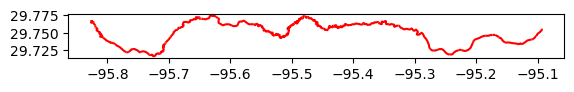

In [32]:
fig, ax = plt.subplots()
geodf_buffaloBayouWithBuffer.plot(ax=ax, edgecolor="red");

In [33]:

geodf_buffaloBayouWithBuffer.to_file("../data/BuffaloBayouLineFromNHDJoined.shp")


# Reproject to a projected CRS
geodf_buffaloBayouWithBuffer_EPSG32615 = geodf_buffaloBayouWithBuffer.to_crs("EPSG:32615")

# Save the GeoDataFrame as a shapefile
geodf_buffaloBayouWithBuffer_EPSG32615.to_file("../data/BuffaloBayouLineFromNHDJoined_EPSG32615.shp")

In [34]:
### Now lets do both all rivers?

In [35]:
geodf_AllRivers = shapefile

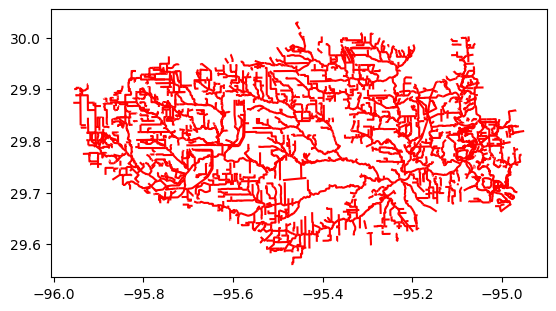

In [36]:
fig, ax = plt.subplots()
geodf_AllRivers.plot(ax=ax, edgecolor="red");

In [37]:
gdf_nhda.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [38]:
#shapefile = gpd.read_file('../data/rivers_NHD/Shape/NHDFlowline.shp')
shapefile[shapefile['gnis_name']!='Buffalo Bayou 3452']
geodf_buffaloBayou = shapefile[shapefile['gnis_name']=='Buffalo Bayou']
geodf_buffaloBayou.to_crs('EPSG:4326')
geodf_buffaloBayou[0:2]

,permanent_,fdate,resolution,gnis_id,gnis_name,lengthkm,reachcode,flowdir,wbarea_per,ftype,fcode,mainpath,innetwork,visibility,SHAPE_Leng,Enabled,ObjectID,geometry
47,113254399,2012-01-04,2,01372802,Buffalo Bayou,0.359,12040104000055,1,None,460,46006,0,1,5000000,0.003579,1,48,"LINESTRING Z (-95.48178 29.77218 0.00000, -95...."
89,113254947,2012-01-04,2,01372802,Buffalo Bayou,0.139,12040104002441,1,120007513,558,55800,0,1,5000000,0.001425,1,90,"LINESTRING Z (-95.11023 29.74014 0.00000, -95...."


In [39]:
gdf_nhda

,id,geometry
0,1,POINT (-95.58979 29.32846)
1,1,POINT (-95.57883 29.34064)
2,1,POINT (-95.58065 29.33918)
3,1,POINT (-95.58283 29.33818)
4,1,POINT (-95.58517 29.33762)
...,...,...
991,1,POINT (-95.82434 29.58160)
992,1,POINT (-95.82356 29.57960)
993,1,POINT (-95.82280 29.57759)
994,1,POINT (-95.82222 29.57552)


In [40]:
# Save rows with LineString geometries to a separate GeoDataFrame
gdf_nhda_lines = gdf_nhda[gdf_nhda.geometry.type != 'Point']
# Combine the GeoDataFrames
combined_gdf = gdf_nhda_lines.append(geodf_buffaloBayou)

# Save the combined GeoDataFrame as a shapefile
combined_gdf.to_file("../data/combined_BrazosBuffaloBayou.shp")

/var/folders/ry/tr7t3nh122z_0n6rz2cl3lv40000gn/T/ipykernel_48762/4122611672.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combined_gdf = gdf_nhda_lines.append(geodf_buffaloBayou)


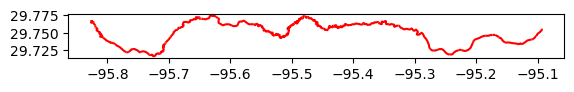

In [41]:
fig, ax = plt.subplots()
combined_gdf.plot(ax=ax, edgecolor="red"); 

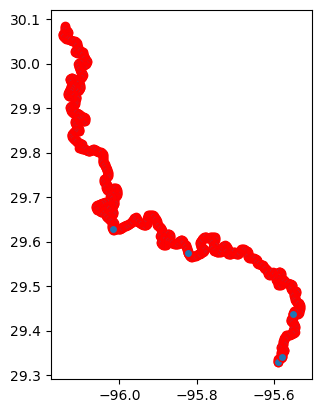

In [42]:
fig, ax = plt.subplots()
gdf_nhda.plot(ax=ax, edgecolor="red"); 

In [43]:
gdf_nhda

,id,geometry
0,1,POINT (-95.58979 29.32846)
1,1,POINT (-95.57883 29.34064)
2,1,POINT (-95.58065 29.33918)
3,1,POINT (-95.58283 29.33818)
4,1,POINT (-95.58517 29.33762)
...,...,...
991,1,POINT (-95.82434 29.58160)
992,1,POINT (-95.82356 29.57960)
993,1,POINT (-95.82280 29.57759)
994,1,POINT (-95.82222 29.57552)


<AxesSubplot:>

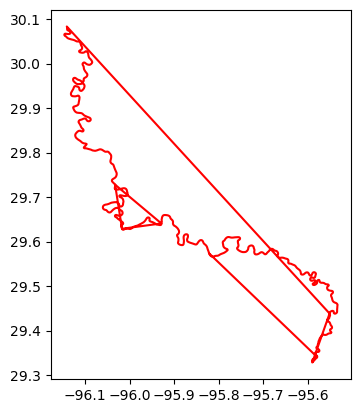

In [44]:
from shapely.geometry import LineString

# Convert the points to a LineString
line = LineString(gdf_nhda.geometry.tolist())

# Create a new GeoDataFrame with the LineString
gdf_nhda_line = gpd.GeoDataFrame(geometry=[line])

# Plot the LineString
fig, ax = plt.subplots()
gdf_nhda_line.plot(ax=ax, edgecolor="red")

/var/folders/ry/tr7t3nh122z_0n6rz2cl3lv40000gn/T/ipykernel_48762/2194634201.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = gdf_nhda.geometry.distance(gdf_nhda.geometry.shift())


<AxesSubplot:>

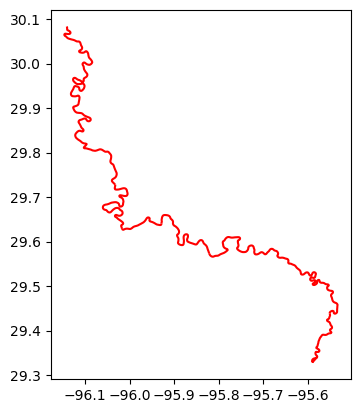

In [45]:
from shapely.geometry import LineString

# # Reproject the data to EPSG:4326
gdf_nhda = gdf_nhda.to_crs(epsg=4326)

# Calculate the distance between consecutive points
distances = gdf_nhda.geometry.distance(gdf_nhda.geometry.shift())

# Set a distance threshold
threshold = 0.04  # replace with your desired threshold

# Create a list to store the points for each LineString
points = []
lines = []

# Iterate over the points and distances
for point, distance in zip(gdf_nhda.geometry, distances):
    # If the distance is less than the threshold, add the point to the current LineString
    if distance <= threshold:
        points.append(point)
    # If the distance is greater than the threshold, start a new LineString
    else:
        # Only add LineStrings with more than one point
        if len(points) > 1:
            lines.append(LineString(points))
        points = [point]

# Add the last LineString if it has more than one point
if len(points) > 1:
    lines.append(LineString(points))

# Create a new GeoDataFrame with the LineStrings
gdf_nhda_lines = gpd.GeoDataFrame(geometry=lines)


# Plot the LineStrings
fig, ax = plt.subplots()
gdf_nhda_lines.plot(ax=ax, edgecolor="red")

In [46]:
geodf_buffaloBayou.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [47]:
# Combine the GeoDataFrames
geodf_buffaloBayou.to_crs(epsg=4326)
combined_gdf = gdf_nhda_lines.append(geodf_buffaloBayou)

# Reproject the data to EPSG:4326
combined_gdf = combined_gdf.set_crs(epsg=4326)

# Save the combined GeoDataFrame as a shapefile
combined_gdf.to_file("../data/combined_BrazosBuffaloBayou.shp")

/var/folders/ry/tr7t3nh122z_0n6rz2cl3lv40000gn/T/ipykernel_48762/3808683421.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combined_gdf = gdf_nhda_lines.append(geodf_buffaloBayou)


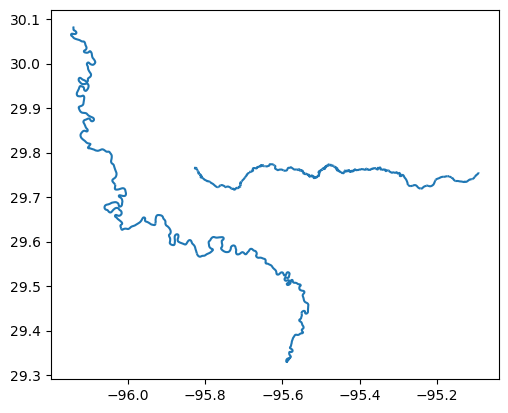

In [48]:
import geopandas as gpd

import matplotlib.pyplot as plt

# Load the shapefile
shapefile_path = "../data/combined_BrazosBuffaloBayou.shp"
gdf = gpd.read_file(shapefile_path)

# Visualize the shapefile
gdf.plot()
plt.show()

[INFO] 2024-05-21 22:30:28,458 - Failed to auto identify EPSG: 7


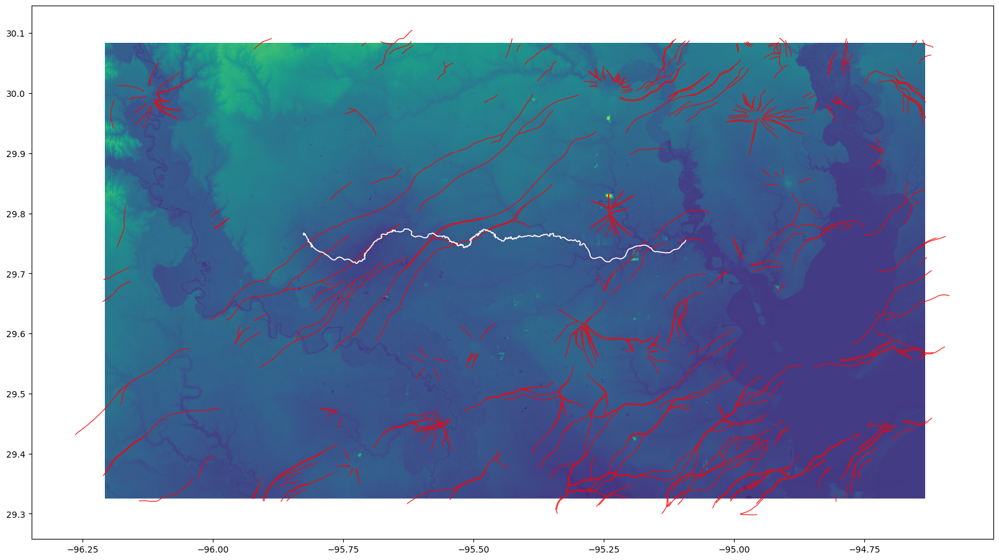

In [49]:
import geopandas as gpd
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
import matplotlib.pyplot as plt

# Load the shapefile and reproject it to EPSG:4326
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')
gdf_faults = gdf_faults.to_crs('EPSG:4326')

# Load the second shapefile and reproject it to EPSG:4326
# gdf_nhda = gpd.read_file('../data/output_rem_data/v1/buffaloBayouRegionalV1_USGS10m_river_pts.shp') #python_data_processing/data/rivers_NHD/Shape/NHDWaterbody.shp
# gdf_nhda = gdf_nhda.to_crs('EPSG:4326')

shapefile = gpd.read_file('../data/rivers_NHD/Shape/NHDFlowline.shp')
shapefile[shapefile['gnis_name']!='Buffalo Bayou 3452']
geodf_buffaloBayou = shapefile[shapefile['gnis_name']=='Buffalo Bayou']
geodf_buffaloBayou.to_crs('EPSG:4326')

# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_REM.tif') as src:
    # Calculate the transform and the dimensions for the new CRS
    transform, width, height = calculate_default_transform(src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    # Create a new raster for the reprojected TIFF
    with rasterio.open('reprojected.tif', 'w', driver='GTiff', height=height, width=width, count=1, dtype=src.dtypes[0], crs='EPSG:4326', transform=transform) as reprojected:
        # Reproject the TIFF to EPSG:4326
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(reprojected, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest)

# Load the reprojected TIFF
with rasterio.open('reprojected.tif') as reprojected:
    img = reprojected.read(1)

    # Clip the reprojected shapefile to the extent of the reprojected TIFF
    gdf_faults = gdf_faults.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]
    geodf_buffaloBayou = geodf_buffaloBayou.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]


# Plot the reprojected TIFF
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Adjust the size as needed
show(img, ax=ax, transform=transform)

# Overlay the reprojected and clipped shapefile
gdf_faults.plot(ax=ax, color='red', edgecolor='red', linewidth=0.8)
geodf_buffaloBayou.plot(ax=ax, color='white', edgecolor='white', linewidth=1.25)

plt.show()

## Now let's load open street map highwas on top as well.

In [50]:
#!conda install -c conda-forge osmnx

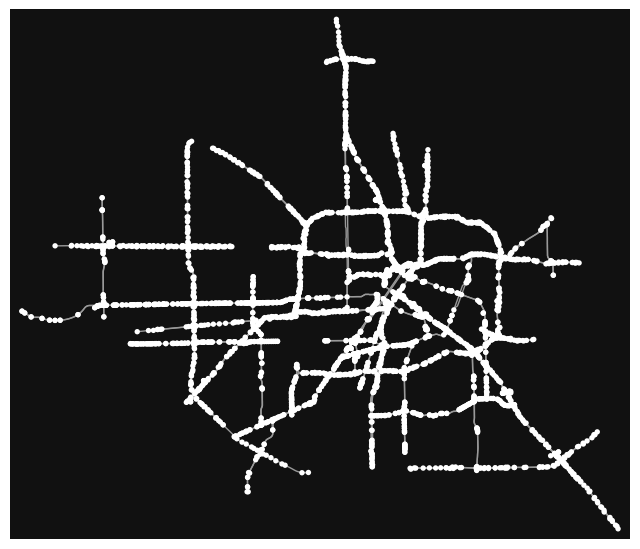

(<Figure size 800x800 with 1 Axes>, <AxesSubplot:>)

In [51]:
import osmnx as ox

# Define the area
place = "Houston, USA"  # replace with your city and country

# Define the filter
custom_filter = '["highway"~"motorway|trunk|primary"]'

# Download the road network
G = ox.graph_from_place(place, network_type='drive', custom_filter=custom_filter)

# Plot the road network
ox.plot_graph(G)

In [52]:
from shapely.geometry import box

[INFO] 2024-05-21 22:39:44,464 - Failed to auto identify EPSG: 7


got to start of highway part
got different points on bounding box
pounts on building box =  30.083329399808324 29.324996273771987 -94.63444939569881 -96.20731933611141 north, south, east, west 
found points on bounding box
 got G from open street map
turned graph into geodataframe


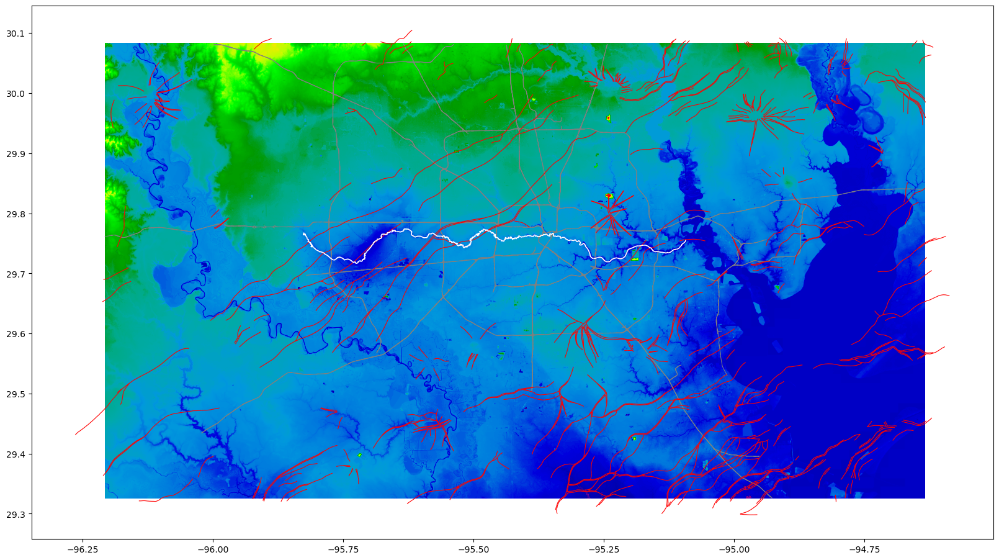

In [64]:
# Load the shapefile and reproject it to EPSG:4326
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')
gdf_faults = gdf_faults.to_crs('EPSG:4326')

# Load the second shapefile and reproject it to EPSG:4326

shapefile = gpd.read_file('../data/rivers_NHD/Shape/NHDFlowline.shp')
shapefile[shapefile['gnis_name']!='Buffalo Bayou 3452']
geodf_buffaloBayou = shapefile[shapefile['gnis_name']=='Buffalo Bayou']
geodf_buffaloBayou.to_crs('EPSG:4326')

# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_REM.tif') as src:
    # Calculate the transform and the dimensions for the new CRS
    transform, width, height = calculate_default_transform(src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    # Create a new raster for the reprojected TIFF
    with rasterio.open('reprojected.tif', 'w', driver='GTiff', height=height, width=width, count=1, dtype=src.dtypes[0], crs='EPSG:4326', transform=transform) as reprojected:
        # Reproject the TIFF to EPSG:4326
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(reprojected, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest)

# Load the reprojected TIFF
with rasterio.open('reprojected.tif') as reprojected:
    img = reprojected.read(1)

    # Clip the reprojected shapefile to the extent of the reprojected TIFF
    gdf_faults = gdf_faults.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]
    geodf_buffaloBayou = geodf_buffaloBayou.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]


print("got to start of highway part")

# Get the bounds from the reprojected GeoDataFrame
bounds = reprojected.bounds

# Create a bounding box from the bounds
bbox = gpd.GeoDataFrame({'geometry': [box(*bounds)]}, crs=reprojected.crs)
# Reproject the bounding box to WGS84 (the CRS used by OpenStreetMap)
bbox = bbox.to_crs(epsg=4326)

print("got different points on bounding box")

# Get the bounding box coordinates
west, south, east, north = bbox.total_bounds
#-96.20731933611141 29.324996273771987 -94.63444939569881 30.083329399808324 north, south, east, west 

print("pounts on building box = ",north, south, east, west , "north, south, east, west ")
print("found points on bounding box")

# Define the filter
custom_filter = '["highway"~"motorway"]'

# Download the road network
G = ox.graph_from_bbox(north, south, east, west, network_type='drive', custom_filter=custom_filter)

print(" got G from open street map")

# Convert the road network to a GeoDataFrame
edges = ox.graph_to_gdfs(G, nodes=False, edges=True)

print("turned graph into geodataframe")

# Plot the reprojected TIFF
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Adjust the size as needed
show(img, ax=ax, transform=transform, cmap='nipy_spectral')


# Overlay the road network
edges.plot(ax=ax, color='gray', linewidth=0.7)  # Adjust color and linewidth as needed

# Overlay the reprojected and clipped shapefile
gdf_faults.plot(ax=ax, color='red', edgecolor='red', linewidth=0.8)
geodf_buffaloBayou.plot(ax=ax, color='white', edgecolor='white', linewidth=1.25)


plt.show()

[INFO] 2024-05-21 22:41:49,311 - Failed to auto identify EPSG: 7


got to start of highway part
got different points on bounding box
pounts on building box =  30.083329399808324 29.324996273771987 -94.63444939569881 -96.20731933611141 north, south, east, west 
found points on bounding box
 got G from open street map
turned graph into geodataframe


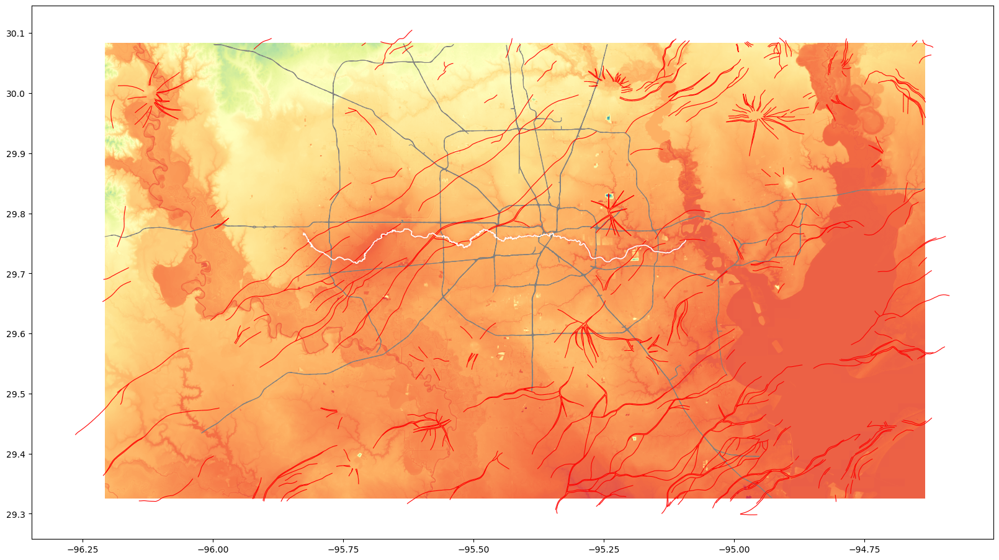

In [66]:
# Load the shapefile and reproject it to EPSG:4326
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')
gdf_faults = gdf_faults.to_crs('EPSG:4326')

# Load the second shapefile and reproject it to EPSG:4326

shapefile = gpd.read_file('../data/rivers_NHD/Shape/NHDFlowline.shp')
shapefile[shapefile['gnis_name']!='Buffalo Bayou 3452']
geodf_buffaloBayou = shapefile[shapefile['gnis_name']=='Buffalo Bayou']
geodf_buffaloBayou.to_crs('EPSG:4326')

# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_REM.tif') as src:
    # Calculate the transform and the dimensions for the new CRS
    transform, width, height = calculate_default_transform(src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    # Create a new raster for the reprojected TIFF
    with rasterio.open('reprojected.tif', 'w', driver='GTiff', height=height, width=width, count=1, dtype=src.dtypes[0], crs='EPSG:4326', transform=transform) as reprojected:
        # Reproject the TIFF to EPSG:4326
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(reprojected, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest)

# Load the reprojected TIFF
with rasterio.open('reprojected.tif') as reprojected:
    img = reprojected.read(1)

    # Clip the reprojected shapefile to the extent of the reprojected TIFF
    gdf_faults = gdf_faults.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]
    geodf_buffaloBayou = geodf_buffaloBayou.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]


print("got to start of highway part")

# Get the bounds from the reprojected GeoDataFrame
bounds = reprojected.bounds

# Create a bounding box from the bounds
bbox = gpd.GeoDataFrame({'geometry': [box(*bounds)]}, crs=reprojected.crs)
# Reproject the bounding box to WGS84 (the CRS used by OpenStreetMap)
bbox = bbox.to_crs(epsg=4326)

print("got different points on bounding box")

# Get the bounding box coordinates
west, south, east, north = bbox.total_bounds
#-96.20731933611141 29.324996273771987 -94.63444939569881 30.083329399808324 north, south, east, west 

print("pounts on building box = ",north, south, east, west , "north, south, east, west ")
print("found points on bounding box")

# Define the filter
custom_filter = '["highway"~"motorway"]'

# Download the road network
G = ox.graph_from_bbox(north, south, east, west, network_type='drive', custom_filter=custom_filter)

print(" got G from open street map")

# Convert the road network to a GeoDataFrame
edges = ox.graph_to_gdfs(G, nodes=False, edges=True)

print("turned graph into geodataframe")

# Plot the reprojected TIFF
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Adjust the size as needed
show(img, ax=ax, transform=transform, cmap='Spectral')


# Overlay the road network
edges.plot(ax=ax, color='gray', linewidth=0.7)  # Adjust color and linewidth as needed

# Overlay the reprojected and clipped shapefile
gdf_faults.plot(ax=ax, color='red', edgecolor='red', linewidth=0.8)
geodf_buffaloBayou.plot(ax=ax, color='white', edgecolor='white', linewidth=1.25)


plt.show()

[INFO] 2024-05-21 22:43:35,296 - Failed to auto identify EPSG: 7


got to start of highway part
got different points on bounding box
pounts on building box =  30.083329399808324 29.324996273771987 -94.63444939569881 -96.20731933611141 north, south, east, west 
found points on bounding box
 got G from open street map
turned graph into geodataframe


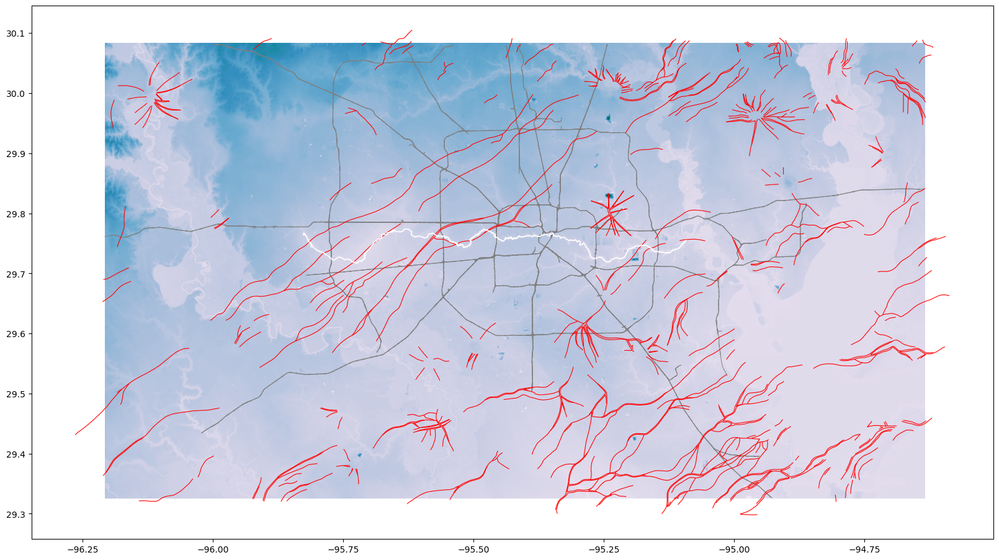

In [67]:
# Load the shapefile and reproject it to EPSG:4326
gdf_faults = gpd.read_file('../data/faults/texas_faults_fromDor/texas_faults.shp')
gdf_faults = gdf_faults.to_crs('EPSG:4326')

# Load the second shapefile and reproject it to EPSG:4326

shapefile = gpd.read_file('../data/rivers_NHD/Shape/NHDFlowline.shp')
shapefile[shapefile['gnis_name']!='Buffalo Bayou 3452']
geodf_buffaloBayou = shapefile[shapefile['gnis_name']=='Buffalo Bayou']
geodf_buffaloBayou.to_crs('EPSG:4326')

# Load the TIFF
with rasterio.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_REM.tif') as src:
    # Calculate the transform and the dimensions for the new CRS
    transform, width, height = calculate_default_transform(src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    # Create a new raster for the reprojected TIFF
    with rasterio.open('reprojected.tif', 'w', driver='GTiff', height=height, width=width, count=1, dtype=src.dtypes[0], crs='EPSG:4326', transform=transform) as reprojected:
        # Reproject the TIFF to EPSG:4326
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(reprojected, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest)

# Load the reprojected TIFF
with rasterio.open('reprojected.tif') as reprojected:
    img = reprojected.read(1)

    # Clip the reprojected shapefile to the extent of the reprojected TIFF
    gdf_faults = gdf_faults.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]
    geodf_buffaloBayou = geodf_buffaloBayou.cx[reprojected.bounds.left:reprojected.bounds.right, reprojected.bounds.bottom:reprojected.bounds.top]


print("got to start of highway part")

# Get the bounds from the reprojected GeoDataFrame
bounds = reprojected.bounds

# Create a bounding box from the bounds
bbox = gpd.GeoDataFrame({'geometry': [box(*bounds)]}, crs=reprojected.crs)
# Reproject the bounding box to WGS84 (the CRS used by OpenStreetMap)
bbox = bbox.to_crs(epsg=4326)

print("got different points on bounding box")

# Get the bounding box coordinates
west, south, east, north = bbox.total_bounds
#-96.20731933611141 29.324996273771987 -94.63444939569881 30.083329399808324 north, south, east, west 

print("pounts on building box = ",north, south, east, west , "north, south, east, west ")
print("found points on bounding box")

# Define the filter
custom_filter = '["highway"~"motorway"]'

# Download the road network
G = ox.graph_from_bbox(north, south, east, west, network_type='drive', custom_filter=custom_filter)

print(" got G from open street map")

# Convert the road network to a GeoDataFrame
edges = ox.graph_to_gdfs(G, nodes=False, edges=True)

print("turned graph into geodataframe")

# Plot the reprojected TIFF
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Adjust the size as needed
show(img, ax=ax, transform=transform, cmap='PuBuGn')


# Overlay the road network
edges.plot(ax=ax, color='gray', linewidth=0.7)  # Adjust color and linewidth as needed

# Overlay the reprojected and clipped shapefile
gdf_faults.plot(ax=ax, color='red', edgecolor='red', linewidth=0.8)
geodf_buffaloBayou.plot(ax=ax, color='white', edgecolor='white', linewidth=1.25)


plt.show()

In [55]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

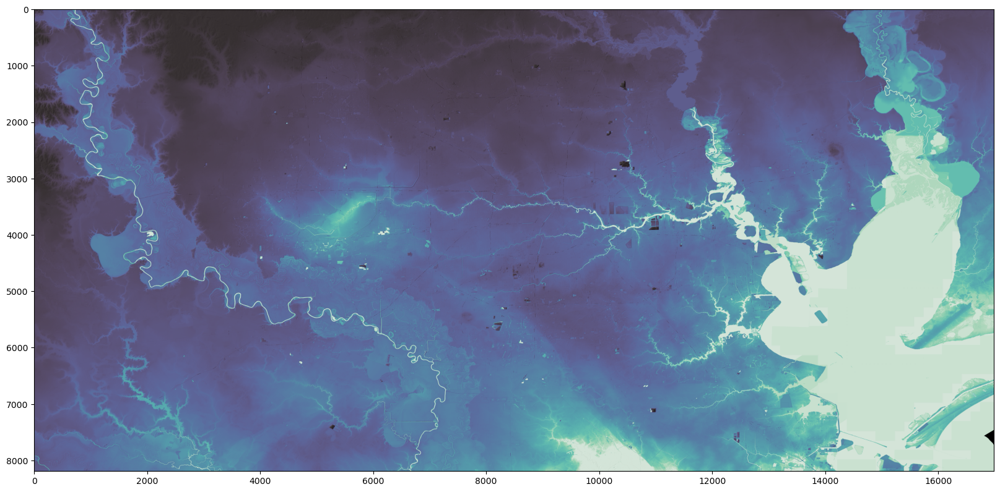

In [59]:

# Load the PNG
img = Image.open('../data/output_rem_data/v3/buffaloBayouRegionalV1_USGS10m_hillshade-color.png')
img_array = np.array(img)

# Plot the PNG
fig, ax = plt.subplots(1, 1, figsize=(20, 20))  # Adjust the size as needed
ax.imshow(img_array)

plt.show()

The PNG looks nicer as the color bar is better. Wonder if I should either use the PNG and transform it into the same CRS as the others or try to get the TIFF to visualize better with different color bar, etc. 